# CASA Summary
The pipeline used for calibration and flagging closely follows that of the CASA pipeline (https://casaguides.nrao.edu/index.php?title=VLA-S-CASA_Pipeline-CASA6.2.1#Stage_7._hifv_checkflag:_Flag_possible_RFI_on_BP_calibrator_using_rflag). This notebook summarises the output of the pipeline (calibration tables, flagging summaries, data plots) and can be used to get an overview of the data and identify bad data that needs to be flagged manually.

In [1]:
import os
import sys
import h5py
import yaml
import casatasks
import numpy as np
from astropy.time import Time
import astropy.units as u
from ipywidgets import interact

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl

cmap = mpl.cm.viridis  
cmap.set_bad(color='red')

from IPython.display import Image

# read yaml file
with open("../input/config.yaml", "r") as file:
    conf = yaml.safe_load(file)
    
sys.path.append(os.path.join(os.curdir, "../"))

from vlapy import vladata, inspect

## Obervation Information 
The data below is the output of CASA's listobs task and can be used to fill in the yaml file "obs.yaml", which contains all the parameters for the pipeline.

In [2]:
obs = conf["obs list"][5]
root = os.path.join(conf["root"], f"{obs}")
name = obs.split(".")[0]

ms = os.path.join(root, f"{obs}_hanning.ms")
vladata.listobs(ms)

BeginTime
58734.43738425926 

EndTime
58734.553333333344 

IntegrationTime
10018.000000953674 

field_0
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.426245723}, 'm1': {'unit': 'rad', 'value': 0.5787469766000002}, 'refer': 'J2000', 'type': 'direction'}
name :  3C48


field_1
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.6013353580000003}, 'm1': {'unit': 'rad', 'value': 0.030493321700000003}, 'refer': 'J2000', 'type': 'direction'}
name :  J0217+0144


field_10
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.6445566377}, 'm1': {'unit': 'rad', 'value': -0.10632060990000002}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J0227-0605


field_11
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.6793999546}, 'm1': {'unit': 'rad', 'value': -0.0967765678}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J0235-0532


field_12
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 0.8872280605}, 'm1': {'unit': 'rad', 'value': 0.097214310

### Array Layout

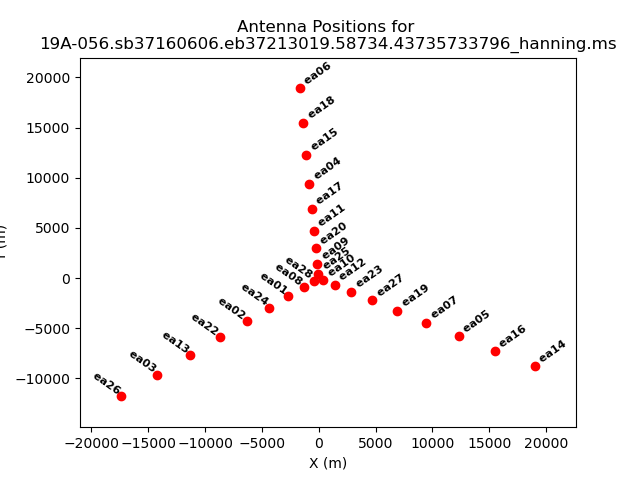

In [3]:
Image(filename=root + "/plots/obsplots/antlayout.png")

### Plot Elevation vs. Time
Observations low in elevation might see more RFI. The plot is colorised by field. Each target field is in between two phase calibrators.

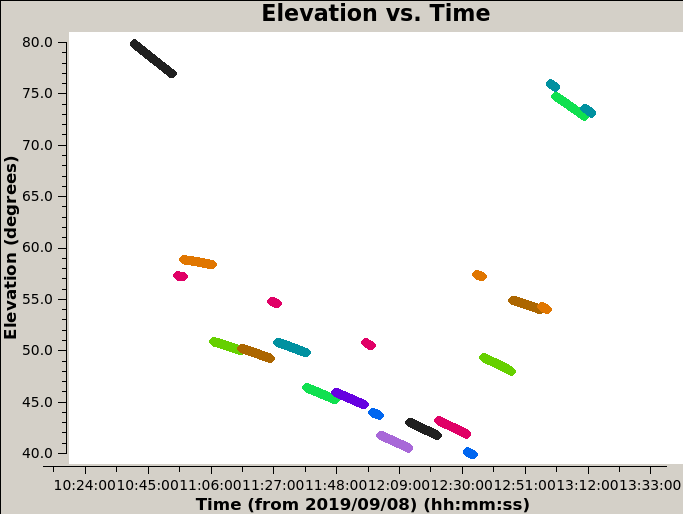

In [4]:
Image(filename=root + "/plots/obsplots/elevation_vs_time.png")

## VLA Deterministic Flags and Manual Flags
These include antennas not on source, shadowed antennas, scans with non-relevant intents, autocorrelations, edge channels of spectral windows, edge channels of the baseband, clipping absolute zero values produced by the correlator and the first few integrations of a scan (quacking). Manual flags are also applied for data known to be bad (RFI, obs reports). Below is a summary of the flags before and after applying the deterministic flags. Use the flagging frequency to find a suitable reference antenna and specify it in the yaml file.

In [5]:
summary_before = np.load(root + "/output/detflag_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/detflag_summary_after.npy", allow_pickle='TRUE').item()

# print flagging summary
def print_summary(item):
    for subitem in summary_before[item]:
        print(f"{item} {subitem}")
        print(
            "Before: {:.4f}, After: {:.4f}".format(
                100.0 * summary_before[item][subitem]["flagged"] / summary_before[item][subitem]["total"],
                100.0 * summary_after[item][subitem]["flagged"] / summary_after[item][subitem]["total"],
            )
        )
        print("")
        
print("Flag occupancy (percent) before and after deterministic flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after deterministic flags:

field 3C48
Before: 16.5414, After: 25.3702

field J0217+0144
Before: 29.5166, After: 36.5105

field J0241-0815
Before: 11.4745, After: 20.2575

field J0323+0534
Before: 24.4970, After: 31.9883

field J0403+2600
Before: 22.4285, After: 30.6579

field QSO J0202-0251
Before: 6.3789, After: 15.6626

field QSO J0206-0255
Before: 3.6993, After: 13.5994

field QSO J0210-0456
Before: 4.7082, After: 14.1575

field QSO J0216-0455
Before: 3.8026, After: 13.5995

field QSO J0217-0208
Before: 4.7513, After: 14.1966

field QSO J0221-0802
Before: 4.7174, After: 14.1670

field QSO J0226+0302
Before: 4.0332, After: 13.6017

field QSO J0227-0605
Before: 4.3851, After: 13.8673

field QSO J0235-0532
Before: 3.9394, After: 13.6006

field QSO J0303-0019
Before: 6.5157, After: 15.7868

field QSO J0353+0104
Before: 7.1066, After: 16.3197

field QSO J0402+2451
Before: 3.7783, After: 13.5982

scan 1
Before: 100.0000, After: 100.0000

scan 10
Before

### Plot Online Flags
Plot flaggingreason vs. time. This shows which antennas are flagged due to focus errors, subreflector errors and antenna not on source. This plot can help identify suitable reference antennas.

In [6]:
if os.path.exists(root+"/plots/dataplots/flaggingreason_vs_time.png"):
    Image(filename=root+"/plots/dataplots/flaggingreason_vs_time.png")

### Plot Antenna Data Stream
If an antenna has missing data, it should not be used as a reference.

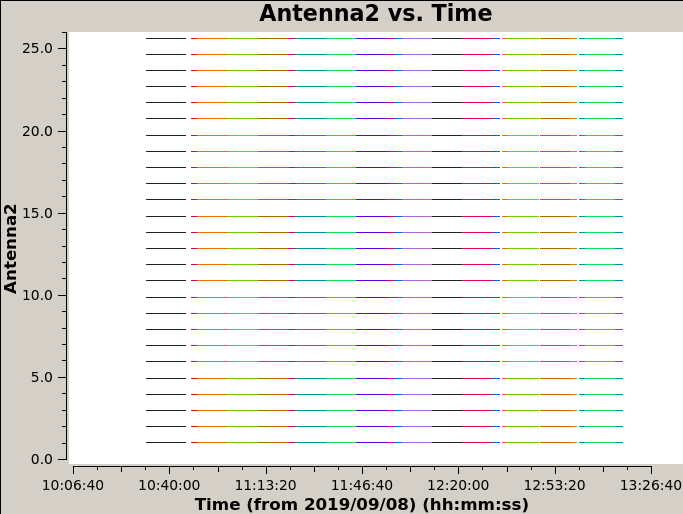

In [7]:
Image(filename=root + "/plots/obsplots/data_stream.png")

## Find Dead Antennas
Antennas that have low power should be flagged. This is also a good time to check for suitable reference antennas.

In [8]:
def plot_dead_ants(ant):
    plotfile = root + f"/plots/dataplots/find_dead_ants_amp_vs_freq_ant_{ant}.png"
    img = mpimg.imread(plotfile)
    plt.imshow(img)
    
interact(plot_dead_ants, ant=(1, 26))
    

interactive(children=(IntSlider(value=13, description='ant', max=26, min=1), Output()), _dom_classes=('widget-…

<function __main__.plot_dead_ants(ant)>

## RFI Inspection
The visibility amplitudes are first averaged across baselines and polarisation products. A modified Z-score is then computed across time as $Z_i = \frac{x_i - \mathrm{med}\{x_i\}_i}{\sigma_\mathrm{MAD}}$, 

where $\sigma_\mathrm{MAD} = \mathrm{med}\{\left|x_i - \mathrm{med}\{x_i\}_i\right|\}$ is the Median Absolute Deviation (MAD), and $x_i$ is the data (visibility amplitude) of the $i^\mathrm{th}$ integration.

The resulting Z-score is a spectrogram with dimensions of time and frequency. It can further be averaged across one of these dimensions to obtain a time series or a spectrum, which are useful for identifying broadband and persistent narrowband RFI respectively.

Use this to identify one clean channel per spectral window which will be used for the initial gain calibration.

#### Load Data

In [9]:

with h5py.File(root + f"/output/z_score_data.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

#### Plot

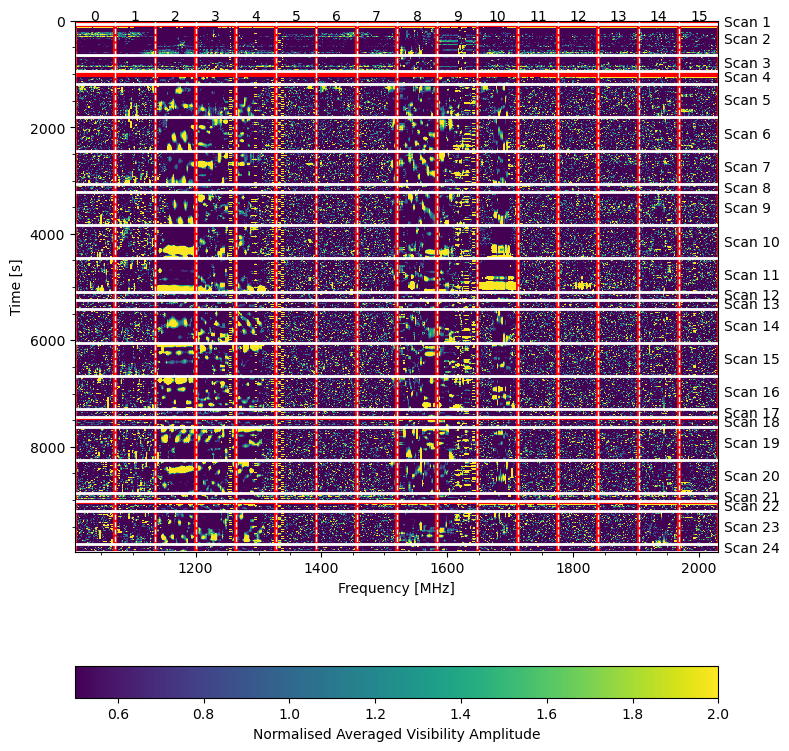

In [10]:
fig, ax = plt.subplots(figsize=(8, 8))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=0.5, vmax=2, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", label="Normalised Averaged Visibility Amplitude")
plt.tight_layout()
plt.show()

In [11]:
def plot_wf_spw(i):
    inspect.plot_wf_spw(freq_array, z_score, i, 2, ntimes, plot_masked=True)
    
interact(plot_wf_spw, i=(0, 15))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.plot_wf_spw(i)>

In [12]:
summary_before = np.load(root + "/output/manual_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/manual_flags_summary_after.npy", allow_pickle='TRUE').item()
        
print("Flag occupancy (percent) before and after manual flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after manual flags:

field 3C48
Before: 64.4919, After: 64.4919

field J0217+0144
Before: 67.8488, After: 67.8488

field J0241-0815
Before: 60.0478, After: 60.0478

field J0323+0534
Before: 64.6669, After: 64.6669

field J0403+2600
Before: 65.1122, After: 65.1122

field QSO J0202-0251
Before: 56.3372, After: 56.3372

field QSO J0206-0255
Before: 54.5790, After: 54.5790

field QSO J0210-0456
Before: 56.0442, After: 56.0442

field QSO J0216-0455
Before: 54.5790, After: 54.5790

field QSO J0217-0208
Before: 55.6046, After: 55.6046

field QSO J0221-0802
Before: 55.4581, After: 55.4581

field QSO J0226+0302
Before: 54.5790, After: 54.5790

field QSO J0227-0605
Before: 55.0185, After: 55.0185

field QSO J0235-0532
Before: 54.5790, After: 54.5790

field QSO J0303-0019
Before: 56.1907, After: 56.1907

field QSO J0353+0104
Before: 56.1907, After: 56.1907

field QSO J0402+2451
Before: 54.5790, After: 54.5790

scan 1
Before: 100.0000, After: 100.0000

scan 10
B

## Flux Calibrator Model
Print model flux densities and plot model amplitude vs. uv-distance. If the calibrator is not resolved, its amplitude should be constant across different uv-distances. If it is slightly resolved, the amplitude will decrease as a function of uv-distance.

In [13]:
setjy = np.load(root + "/output/setjy.npy", allow_pickle='TRUE').item()

print("model flux densities in Jy\n")

for spw in range(16):
    print("SPW {:2d}: I: {:.2f}, U: {:.2f}, V: {:.2f}, Q: {:.2f}".format(spw, *setjy["0"][str(spw)]["fluxd"]))

model flux densities in Jy

SPW  0: I: 21.02, U: 0.00, V: 0.00, Q: 0.00
SPW  1: I: 20.06, U: 0.00, V: 0.00, Q: 0.00
SPW  2: I: 19.18, U: 0.00, V: 0.00, Q: 0.00
SPW  3: I: 18.38, U: 0.00, V: 0.00, Q: 0.00
SPW  4: I: 17.64, U: 0.00, V: 0.00, Q: 0.00
SPW  5: I: 16.96, U: 0.00, V: 0.00, Q: 0.00
SPW  6: I: 16.33, U: 0.00, V: 0.00, Q: 0.00
SPW  7: I: 15.75, U: 0.00, V: 0.00, Q: 0.00
SPW  8: I: 15.20, U: 0.00, V: 0.00, Q: 0.00
SPW  9: I: 14.70, U: 0.00, V: 0.00, Q: 0.00
SPW 10: I: 14.22, U: 0.00, V: 0.00, Q: 0.00
SPW 11: I: 13.78, U: 0.00, V: 0.00, Q: 0.00
SPW 12: I: 13.36, U: 0.00, V: 0.00, Q: 0.00
SPW 13: I: 12.97, U: 0.00, V: 0.00, Q: 0.00
SPW 14: I: 12.59, U: 0.00, V: 0.00, Q: 0.00
SPW 15: I: 12.24, U: 0.00, V: 0.00, Q: 0.00


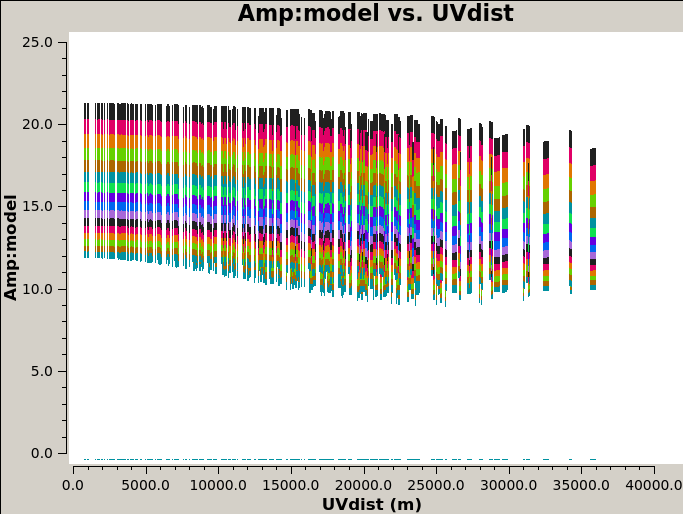

In [14]:
Image(filename=root + "/plots/calplots/setjy_model_amp_vs_uvdist.png")

## Prior Calibration

The prior calibration includes atmospheric opacity corrections, antenna offset corrections and requantizer (rq) gains. These are independent of calibrator observations and use external data instead.

### Weather
Plot weather data and print opacities. For frequencies below 10 GHz the opacity is negligibly small.  

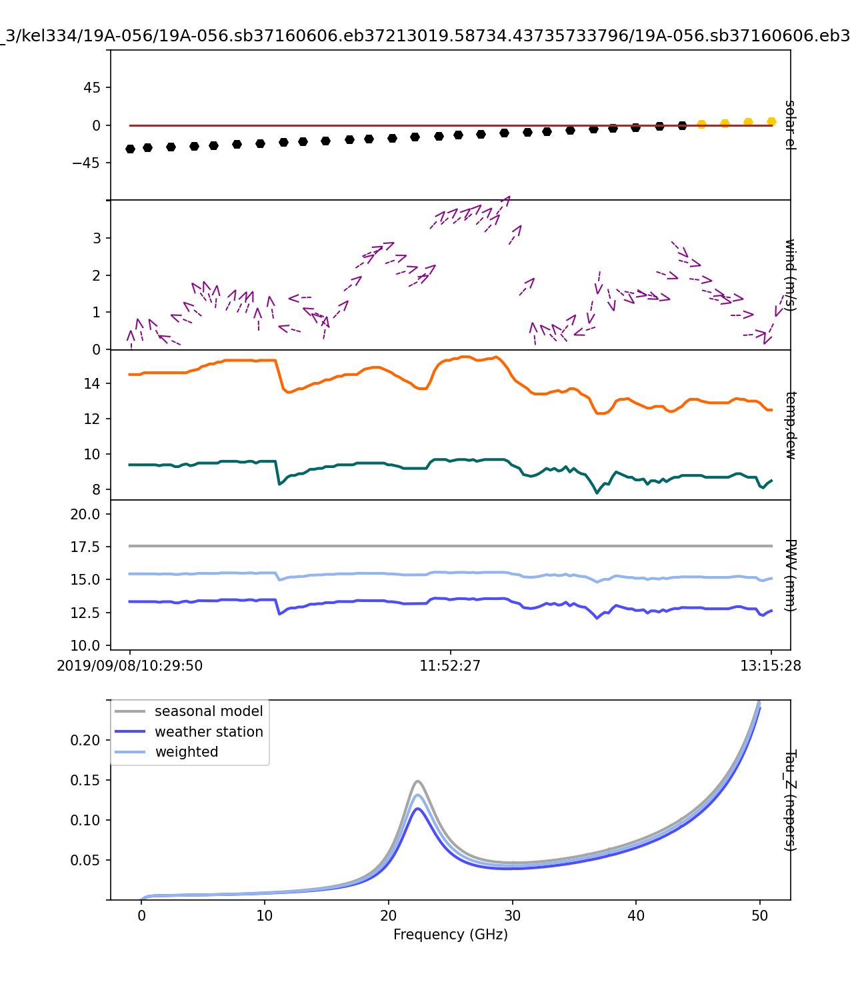

In [15]:
Image(filename=root + "/plots/calplots/weather.png")

In [16]:
opacities = np.load(root + "/output/weather.npy")

print("Opacities [Nepers]\n")

for spw, opacity in enumerate(opacities):
    print(f"SPW {spw}: {opacity}")

Opacities [Nepers]

SPW 0: 0.005155810050420372
SPW 1: 0.005215989627968652
SPW 2: 0.0052683926963789885
SPW 3: 0.005314244160861137
SPW 4: 0.005354981946379555
SPW 5: 0.005391203238371951
SPW 6: 0.005423839425254766
SPW 7: 0.005453365093816776
SPW 8: 0.0054803097668831135
SPW 9: 0.005505080365404104
SPW 10: 0.005527967305993047
SPW 11: 0.00554931758825905
SPW 12: 0.005569279962076095
SPW 13: 0.0055881339255748575
SPW 14: 0.00560599023902608
SPW 15: 0.005623027460734493


## Plot Calibration Channels
These are the channels that have been selected for the gain calibration. They should be clean and should not exhibit any amplitude jumps.

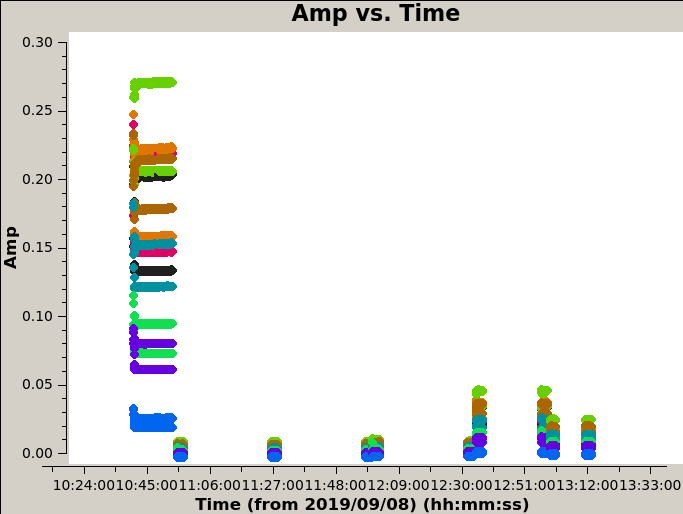

In [17]:
Image(filename=root + "/plots/dataplots/single_chans_amp_vs_time.png")

## Initial Calibration
The initial calibration is done to enable subsequent flagging with automated flagging routines such as CASA's RFlag. The calibration consists of an initial gain phase calibration, a delay calibration, an initial gain phase and amplitude calibration and a bandpass calibration. The two gain calibrations are used for the delay and bandpass calibrations, but are not applied to the data. The gain calibrations are done with a single channel per spectral window.

In [18]:
def plot_two_cols(im1, im2):
    """ 
    Plot two image side by side. E.g phase and amplitude.
    """
    fix, ax = plt.subplots(1, 2, figsize=(15, 5))

    if os.path.exists(im1):
        img_1 = mpimg.imread(im1)
        ax[0].imshow(img_1)

    if os.path.exists(im2):
        img_2 = mpimg.imread(im2)
        ax[1].imshow(img_2)

### Specify Gain Tables

In [19]:
# specify calibration table names
rnd = 0
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration
This is an initial per-integration phase calibration and is done to avoid decorrelation under temporal averaging in the subsequent delay calibration. The gain phase should be stable in time. Antennas or spectral windows that have gain phase discontinuities should be flagged. If all but the reference antenna exhibit phase jumps, a difference reference antenna should be chosen.

In [20]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration
The delay calibration is done by fitting for the phase slopes across frequency with respect to the reference antenna. The first and last 15 channels of the spectral windows are not used in this step, since they have lower gains. The delays should lie between -5 and 5 ns, and anything outside that range should be treated with suspicion.

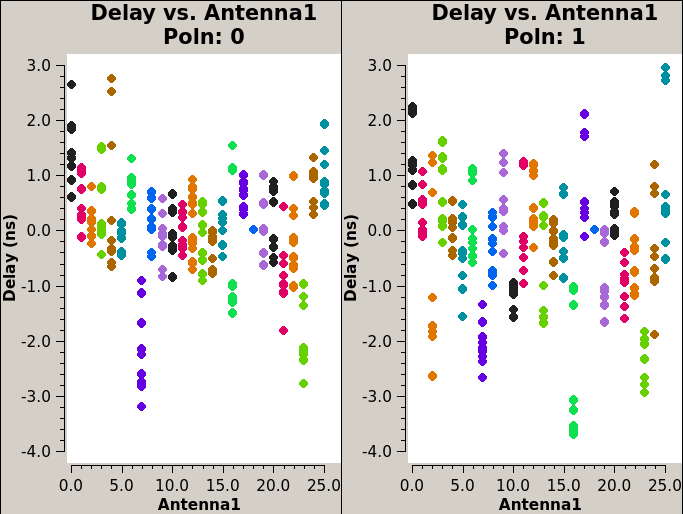

In [21]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration
Similarly to above, we perform an initial gain calibration for the bandpass calibration, but this time we also solve for the amplitudes. The phases and amplitudes should be constant with time and discontinuous solutions should be flagged.

In [22]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration
The amplitudes and phases of the bandpass calibration should be close to 1 and zero respectively after the initial gain calibration. Discontinuities should be flagged.

In [23]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [24]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Plot Corrected Data
This data is averaged in time and colorised by antenna.

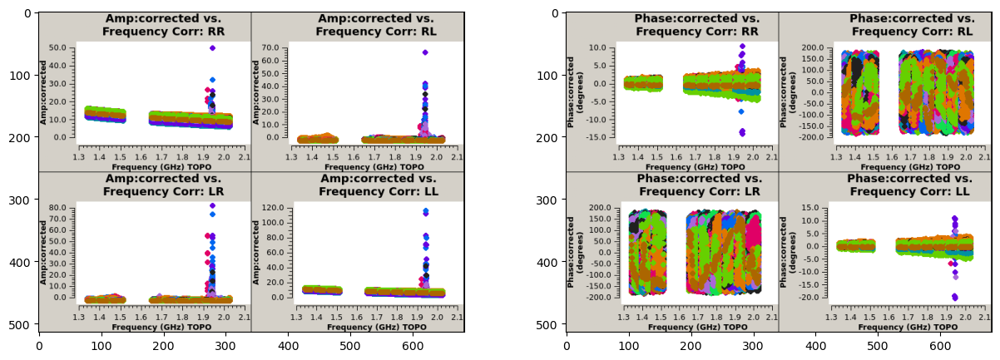

In [25]:
plot_two_cols(
    root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_CorrRR,RL,LR,LL.png",
    root + f"/plots/dataplots/fluxcal_initcal_round_0_phase_vs_freq_CorrRR,RL,LR,LL.png"
)

#### Plot Averaged Corrected Data
Iterate through spectral windows to identify RFI and flag bad channels manually below.

In [26]:
def plot_corrected_spw(spw):
    img = mpimg.imread(root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_avg_spw_{spw}_CorrRR,RL,LR,LL.png")
    plt.imshow(img)

interact(plot_corrected_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_corrected_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [27]:
rnd=0
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 0:

field 3C48
Before: 32.4674, After: 64.4919

antenna ea01
Before: 31.5534, After: 62.9446

antenna ea02
Before: 31.5687, After: 62.9446

antenna ea03
Before: 31.5547, After: 62.9446

antenna ea04
Before: 31.5581, After: 62.9446

antenna ea05
Before: 31.5534, After: 62.9446

antenna ea06
Before: 31.5687, After: 62.9446

antenna ea07
Before: 31.5547, After: 62.9446

antenna ea08
Before: 31.5581, After: 62.9446

antenna ea09
Before: 31.5534, After: 62.9446

antenna ea10
Before: 31.5687, After: 62.9446

antenna ea11
Before: 31.5547, After: 62.9446

antenna ea12
Before: 31.5581, After: 62.9446

antenna ea13
Before: 31.5534, After: 62.9446

antenna ea14
Before: 31.5687, After: 62.9446

antenna ea15
Before: 31.5547, After: 62.9446

antenna ea16
Before: 35.6063, After: 66.9927

antenna ea17
Before: 31.5534, After: 62.9446

antenna ea18
Before: 31.9061, After: 63.2819

antenna ea19
Before: 31.5547, After: 62.9446

antenna ea

## First Round of Flagging on Primary Calibrator
The first round of flagging is performed on the primary calibrator only. The flagging routine runs RFlag with timedevscale=5.0, freqdevscale=5.0 and freqfit=line on a ABS_RL, ABS_LR, ABS_LL, ABS_RR, REAL_LL, REAL_RR, IMAG_LL and IMAG_RR, where for the real and imaginary parts RFLag is performed on the residual (corrected-model) data. TFCrop is run with timecutoff=4.0 and freqcutoff=4.0 on ABS_RL, ABS_LR, ABS_LL and ABS_RR. Flags are extended across polarisations. The plots below show the amplitudes and phases of the calibrators before and after flagging respectively.

### Before Flagging

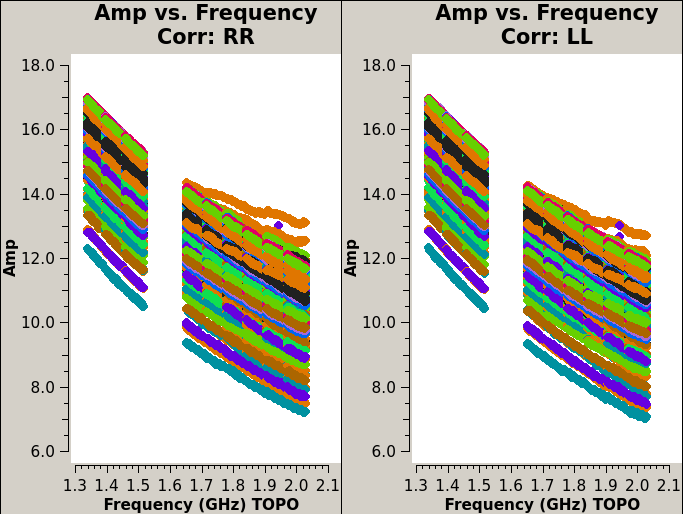

In [28]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

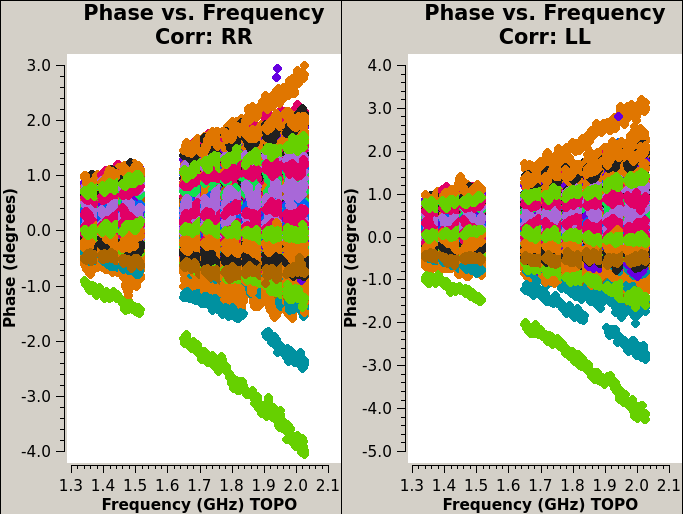

In [29]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

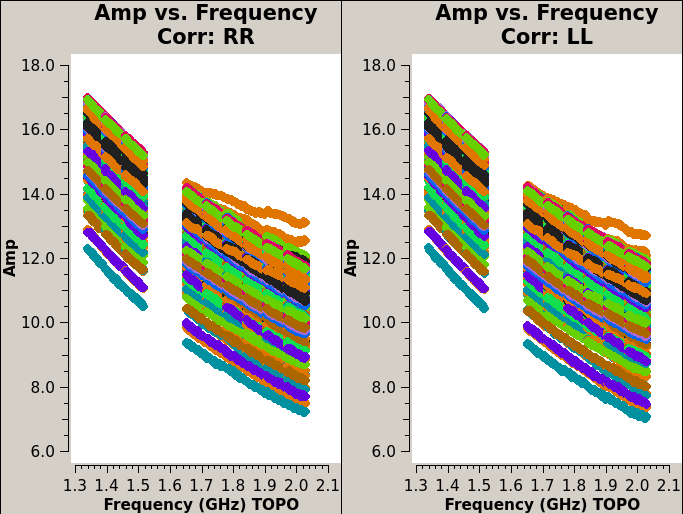

In [30]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

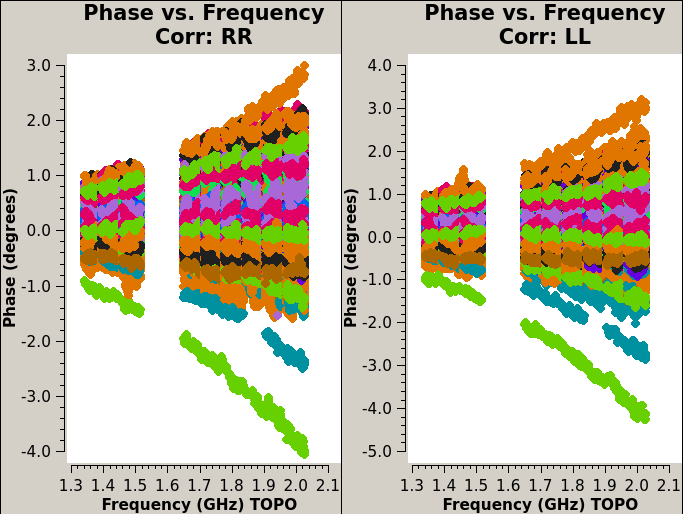

In [31]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Summary

In [32]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C48
Before: 64.4919, After: 64.5980

antenna ea01
Before: 62.9446, After: 62.9766

antenna ea02
Before: 62.9446, After: 62.9914

antenna ea03
Before: 62.9446, After: 62.9609

antenna ea04
Before: 62.9446, After: 62.9964

antenna ea05
Before: 62.9446, After: 62.9587

antenna ea06
Before: 62.9446, After: 63.0091

antenna ea07
Before: 62.9446, After: 62.9841

antenna ea08
Before: 62.9446, After: 63.0695

antenna ea09
Before: 62.9446, After: 63.1535

antenna ea10
Before: 62.9446, After: 63.1790

antenna ea11
Before: 62.9446, After: 63.0485

antenna ea12
Before: 62.9446, After: 63.1047

antenna ea13
Before: 62.9446, After: 63.1179

antenna ea14
Before: 62.9446, After: 62.9652

antenna ea15
Before: 62.9446, After: 62.9827

antenna ea16
Before: 66.9927, After: 67.0181

antenna ea17
Before: 62.9446, After: 63.0520

antenna ea18
Before: 63.2819, After: 63.6563

antenna ea19
Before: 62.9446, After: 62.9987

antenna e

## Semi-Final Calibration
The steps from the intitial calibration are repeated. 

### Specify Gain Tables

In [33]:
# specify calibration table names
rnd = 1
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration

In [34]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

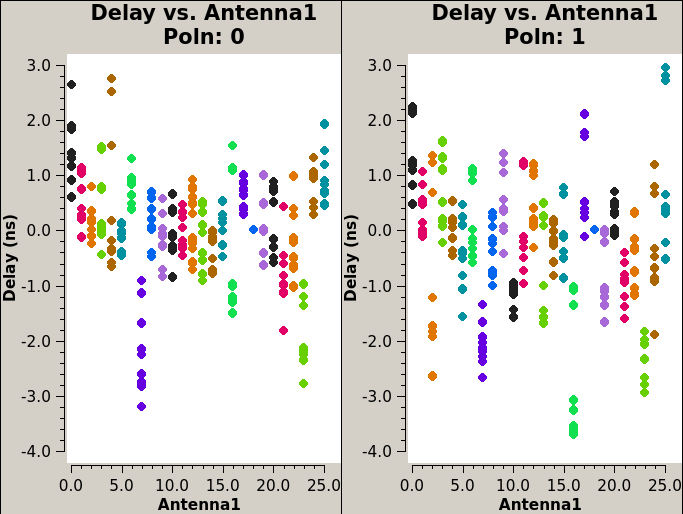

In [35]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [36]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [37]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [38]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [39]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 1:

field 3C48
Before: 64.5980, After: 64.5980

antenna ea01
Before: 62.9766, After: 62.9766

antenna ea02
Before: 62.9914, After: 62.9914

antenna ea03
Before: 62.9609, After: 62.9609

antenna ea04
Before: 62.9964, After: 62.9964

antenna ea05
Before: 62.9587, After: 62.9587

antenna ea06
Before: 63.0091, After: 63.0091

antenna ea07
Before: 62.9841, After: 62.9841

antenna ea08
Before: 63.0695, After: 63.0695

antenna ea09
Before: 63.1535, After: 63.1535

antenna ea10
Before: 63.1790, After: 63.1790

antenna ea11
Before: 63.0485, After: 63.0485

antenna ea12
Before: 63.1047, After: 63.1047

antenna ea13
Before: 63.1179, After: 63.1179

antenna ea14
Before: 62.9652, After: 62.9652

antenna ea15
Before: 62.9827, After: 62.9827

antenna ea16
Before: 67.0181, After: 67.0181

antenna ea17
Before: 63.0520, After: 63.0520

antenna ea18
Before: 63.6563, After: 63.6563

antenna ea19
Before: 62.9987, After: 62.9987

antenna ea

## Second Round of Flagging
The flagging is repeated, but this time on all calibrators.

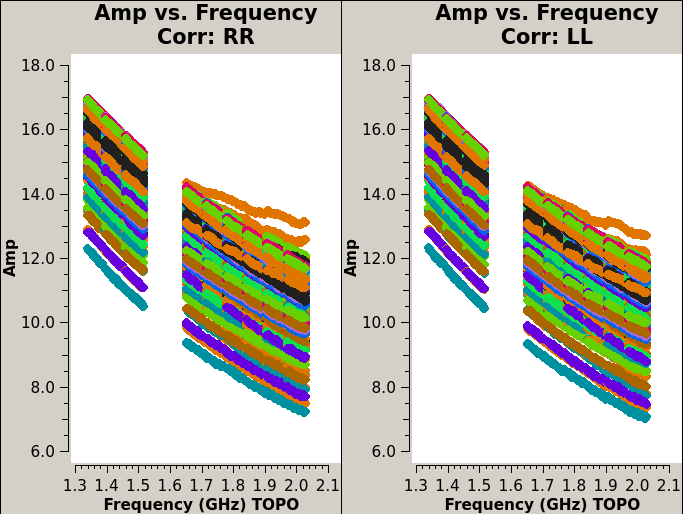

In [40]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

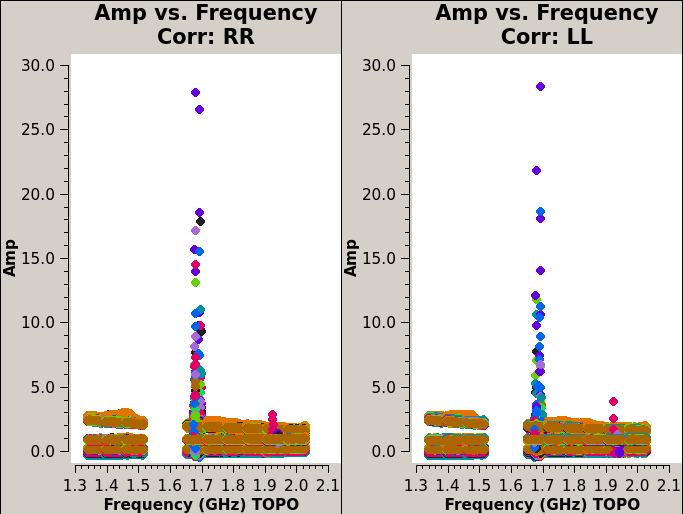

In [41]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

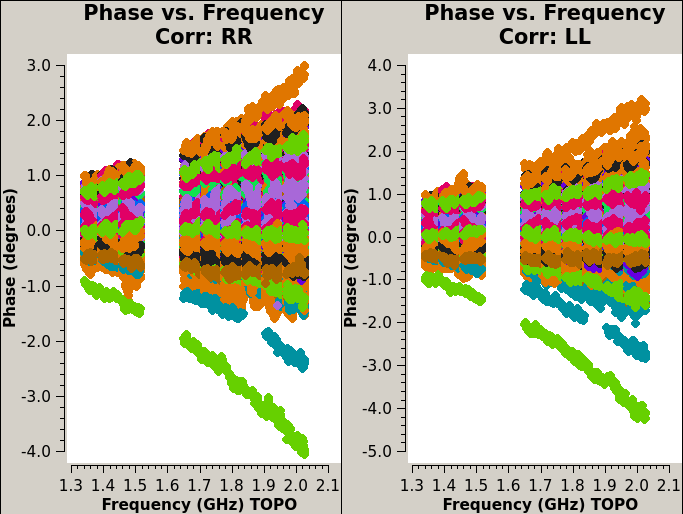

In [42]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

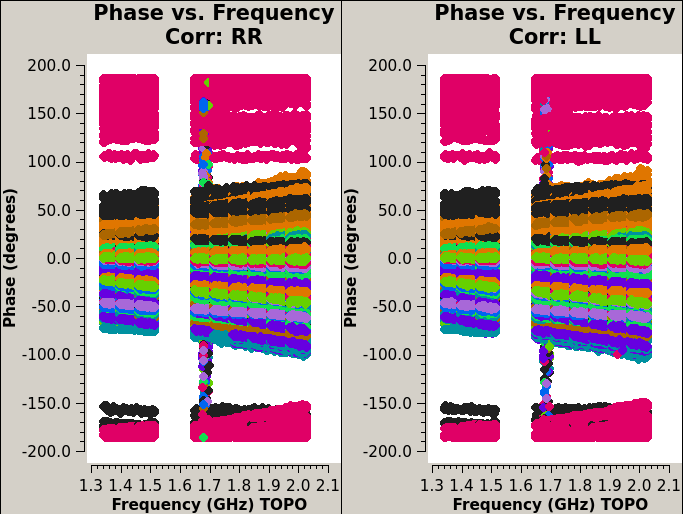

In [43]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

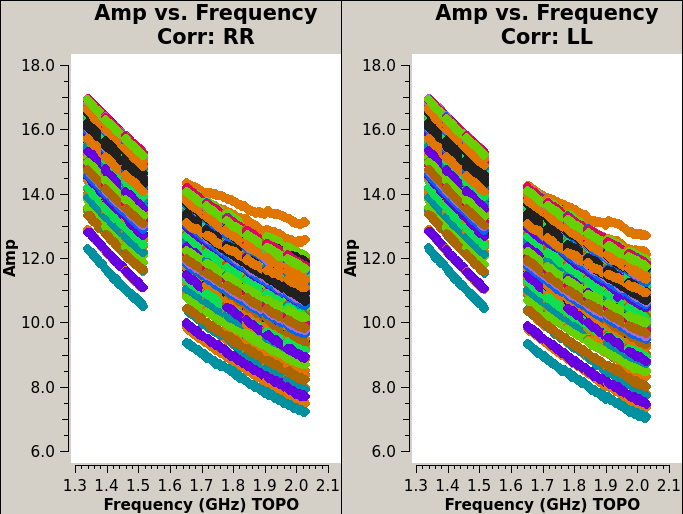

In [44]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

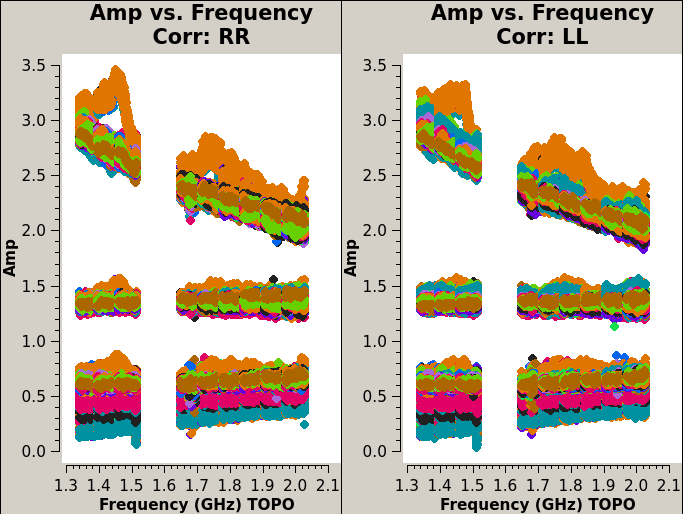

In [45]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

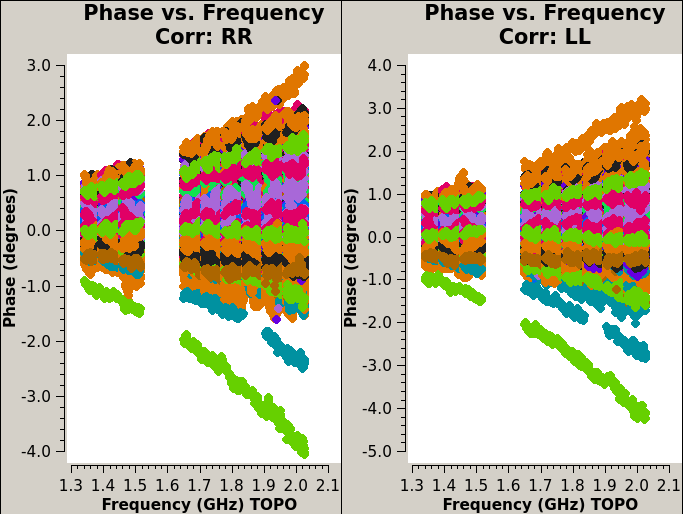

In [46]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

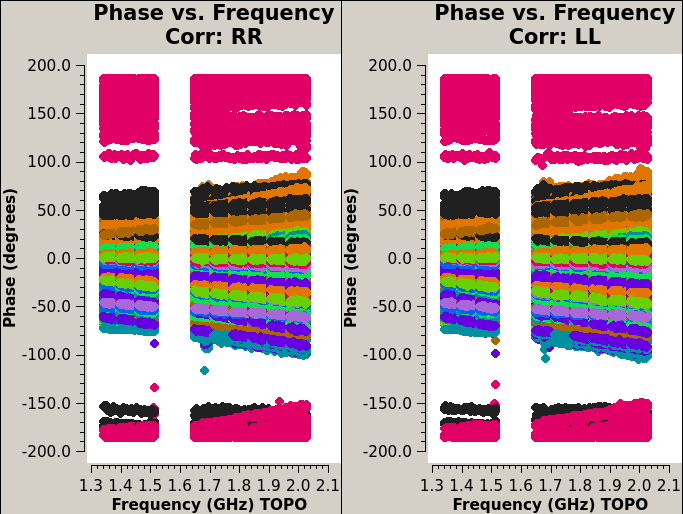

In [47]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Flagging Summary

In [48]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C48
Before: 64.5980, After: 64.6915

scan 1
Before: 100.0000, After: 100.0000

scan 2
Before: 66.0906, After: 66.1798

scan 3
Before: 55.1978, After: 55.3168

antenna ea01
Before: 62.9766, After: 63.0328

antenna ea02
Before: 62.9914, After: 63.0434

antenna ea03
Before: 62.9609, After: 63.0125

antenna ea04
Before: 62.9964, After: 63.0888

antenna ea05
Before: 62.9587, After: 63.0114

antenna ea06
Before: 63.0091, After: 63.1416

antenna ea07
Before: 62.9841, After: 63.0789

antenna ea08
Before: 63.0695, After: 63.1624

antenna ea09
Before: 63.1535, After: 63.2552

antenna ea10
Before: 63.1790, After: 63.3161

antenna ea11
Before: 63.0485, After: 63.1385

antenna ea12
Before: 63.1047, After: 63.2881

antenna ea13
Before: 63.1179, After: 63.3036

antenna ea14
Before: 62.9652, After: 63.0310

antenna ea15
Before: 62.9827, After: 63.0763

antenna ea16
Before: 67.0181, After: 67.0841

antenna ea17
Before: 63.0

In [49]:
summary_before = np.load(root + f"/output/phasecal_round_0_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/phasecal_round_0_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the phase calibrators:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the phase calibrators:

field J0217+0144
Before: 67.8488, After: 68.5189

field J0241-0815
Before: 60.0478, After: 61.3143

field J0323+0534
Before: 64.6669, After: 65.4317

field J0403+2600
Before: 65.1122, After: 65.6006

scan 12
Before: 62.1960, After: 63.0617

scan 13
Before: 61.8687, After: 62.7333

scan 17
Before: 57.8578, After: 59.6076

scan 18
Before: 67.5369, After: 68.3189

scan 21
Before: 61.2151, After: 61.9592

scan 22
Before: 72.6898, After: 73.1141

scan 24
Before: 55.9986, After: 56.5641

scan 4
Before: 75.6499, After: 76.2381

scan 8
Before: 60.9565, After: 61.5629

antenna ea01
Before: 63.3311, After: 64.0933

antenna ea02
Before: 63.4221, After: 64.1018

antenna ea03
Before: 63.3082, After: 63.8205

antenna ea04
Before: 63.3158, After: 64.1525

antenna ea05
Before: 63.4752, After: 63.9304

antenna ea06
Before: 63.4752, After: 64.1875

antenna ea07
Before: 63.3311, After: 63.8037

antenna ea08
Before: 63.3311, After:

## Final Calibration
First, the initial calibration (delay and bandpass) are repeated on the primary calibrator. Then, the final gains of the calibrators are derived.

### Specify Gain Tables

In [50]:
# specify calibration table names
rnd = 2
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

fluxcal_phase_table = f"{name}_fluxcal_phase.Gfinal"
short_gain_table = f"{name}_short.Gfinal"
amp_gain_table = f"{name}_amp.Gfinal"
phase_gain_table = f"{name}_phase.Gfinal"

### Delay Initial Gain Calibration

In [51]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

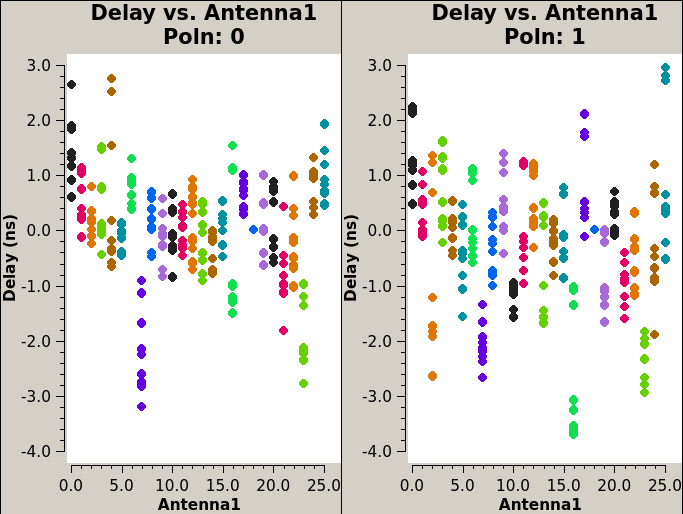

In [52]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [53]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [54]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [55]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flux Calibrator Final Gain Phase

In [56]:
def plot_final_fluxcal_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{fluxcal_phase_table}_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_fluxcal_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_fluxcal_phase(ant)>

### Short Interval Gain Calibration
This is an initial calibration done on a per-integration basis on the calibrators.

In [57]:
def plot_final_short_gain_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{short_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_short_gain_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_short_gain_phase(ant)>

### Long Interval Gain Calibration
The gain amplitudes of the calibrators of solved for using the initial gain phase calibration above.

In [58]:
def plot_final_long_gain(ant):
    plot_two_cols(
        root + f'/plots/calplots/{amp_gain_table}_amp_ant_{ant}_Poln0,1.png',
        root + f'/plots/calplots/{amp_gain_table}_phase_ant_{ant}_Poln0,1.png'
    )

interact(plot_final_long_gain, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_long_gain(ant)>

### Phase Calibration
Derive the final gain phases of the calibrators. That of the primary calibrator should be close to zero, since it was already derived and applied earlier on.

In [59]:
def plot_final_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{phase_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_phase(ant)>

### Flagging Summary

In [60]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after final delay and bandpass calibration:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after final delay and bandpass calibration:

field 3C48
Before: 64.5980, After: 64.5980

antenna ea01
Before: 62.9766, After: 62.9766

antenna ea02
Before: 62.9914, After: 62.9914

antenna ea03
Before: 62.9609, After: 62.9609

antenna ea04
Before: 62.9964, After: 62.9964

antenna ea05
Before: 62.9587, After: 62.9587

antenna ea06
Before: 63.0091, After: 63.0091

antenna ea07
Before: 62.9841, After: 62.9841

antenna ea08
Before: 63.0695, After: 63.0695

antenna ea09
Before: 63.1535, After: 63.1535

antenna ea10
Before: 63.1790, After: 63.1790

antenna ea11
Before: 63.0485, After: 63.0485

antenna ea12
Before: 63.1047, After: 63.1047

antenna ea13
Before: 63.1179, After: 63.1179

antenna ea14
Before: 62.9652, After: 62.9652

antenna ea15
Before: 62.9827, After: 62.9827

antenna ea16
Before: 67.0181, After: 67.0181

antenna ea17
Before: 63.0520, After: 63.0520

antenna ea18
Before: 63.6563, After: 63.6563

antenna ea19
Before: 62.9987, After: 62.9987

a

In [61]:
summary_before = np.load(root + f"/output/applycal_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/applycal_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after applying final calibration:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after applying final calibration:

field 3C48
Before: 64.6915, After: 64.6915

field J0217+0144
Before: 68.5189, After: 68.5189

field J0241-0815
Before: 61.3143, After: 61.3143

field J0323+0534
Before: 65.4317, After: 65.4317

field J0403+2600
Before: 65.6006, After: 65.6006

field QSO J0202-0251
Before: 56.3372, After: 56.3372

field QSO J0206-0255
Before: 54.5790, After: 54.5790

field QSO J0210-0456
Before: 56.0442, After: 56.0442

field QSO J0216-0455
Before: 54.5790, After: 54.5790

field QSO J0217-0208
Before: 55.6046, After: 55.6046

field QSO J0221-0802
Before: 55.4581, After: 55.4581

field QSO J0226+0302
Before: 54.5790, After: 54.5790

field QSO J0227-0605
Before: 55.0185, After: 55.0185

field QSO J0235-0532
Before: 54.5790, After: 54.5790

field QSO J0303-0019
Before: 56.1907, After: 56.1907

field QSO J0353+0104
Before: 56.1907, After: 56.1907

field QSO J0402+2451
Before: 54.5790, After: 54.5790

scan 1
Before: 100.0000, After: 100.0

## Target Flags
Now that the final calibration tables have been derived and applied to the data, the automated flagging routine is run on the target fields.

### Before Flagging

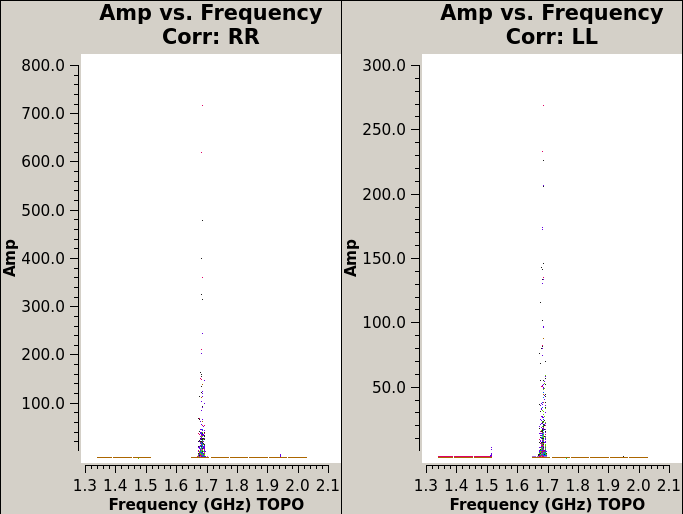

In [62]:
Image(filename=root + "/plots/dataplots/before_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### After Flagging

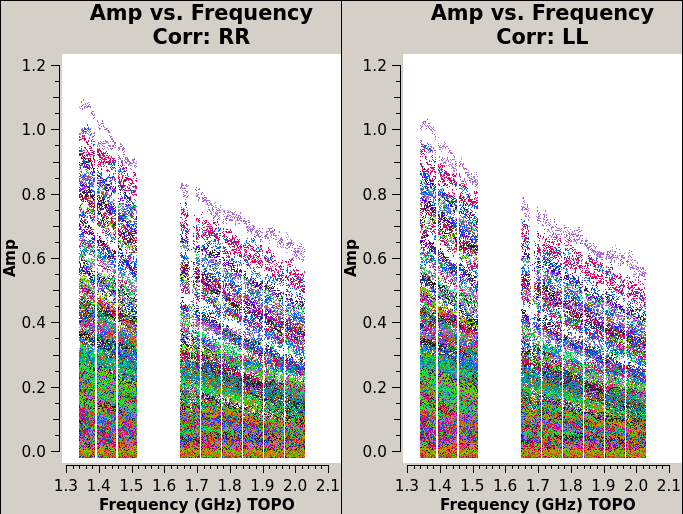

In [63]:
Image(filename=root + "/plots/dataplots/after_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### Summary

In [64]:
rnd=0
summary_before = np.load(root + f"/output/targets_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/targets_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) after flagging the flux calibrator:

field QSO J0202-0251
Before: 56.3372, After: 57.2023

field QSO J0206-0255
Before: 54.5790, After: 55.5412

field QSO J0210-0456
Before: 56.0442, After: 58.0458

field QSO J0216-0455
Before: 54.5790, After: 57.2012

field QSO J0217-0208
Before: 55.6046, After: 56.5504

field QSO J0221-0802
Before: 55.4581, After: 57.4446

field QSO J0226+0302
Before: 54.5790, After: 55.6574

field QSO J0227-0605
Before: 55.0185, After: 56.8051

field QSO J0235-0532
Before: 54.5790, After: 56.4646

field QSO J0303-0019
Before: 56.1907, After: 57.2848

field QSO J0353+0104
Before: 56.1907, After: 57.1185

field QSO J0402+2451
Before: 54.5790, After: 55.1608

scan 10
Before: 56.0442, After: 58.0458

scan 11
Before: 54.5790, After: 57.2012

scan 14
Before: 55.4581, After: 57.4446

scan 15
Before: 55.0185, After: 56.8051

scan 16
Before: 54.5790, After: 56.4646

scan 19
Before: 56.1907, After: 57.2848

scan 20
Before: 56.1907, After: 57.1185

sca

## Summary Plots
These plots show the corrected amplitudes and phases of all fields as a function of uv-distance and frequency. The values plotted against uv-distance are colorised by spectral window while those plotted against frequency are colorised by antenna number. Remaining RFI should be flagged manually in CASA.

In [65]:
field_dict = vladata.get_field_names(ms)
fields = field_dict["calibrators"] + "," + field_dict["targets"]

3C48


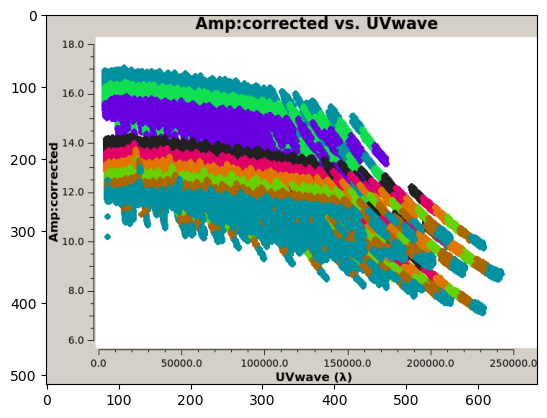

J0217+0144


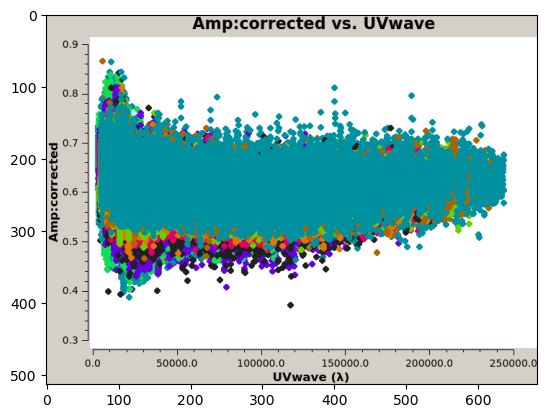

J0241-0815


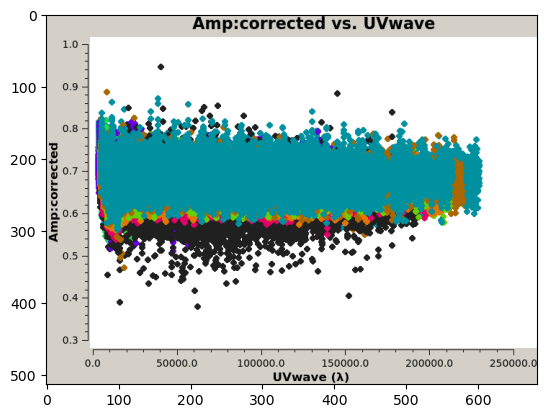

J0323+0534


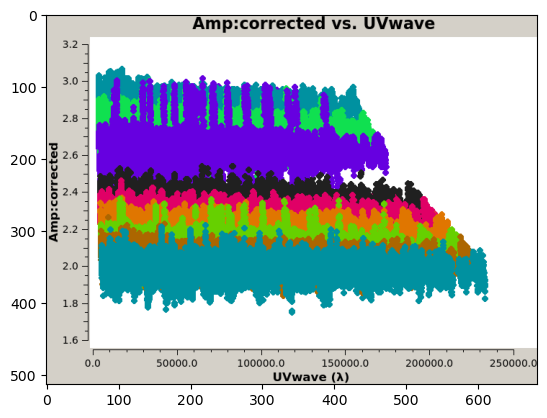

J0403+2600


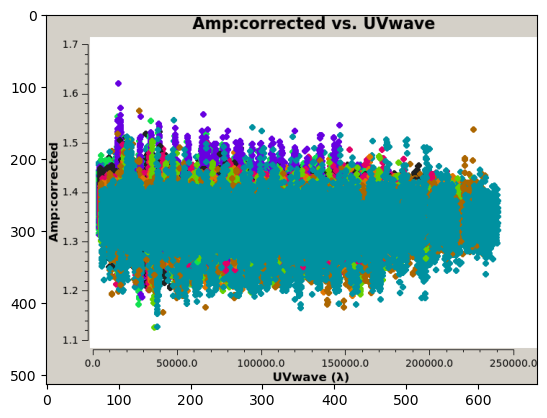

QSO J0226+0302


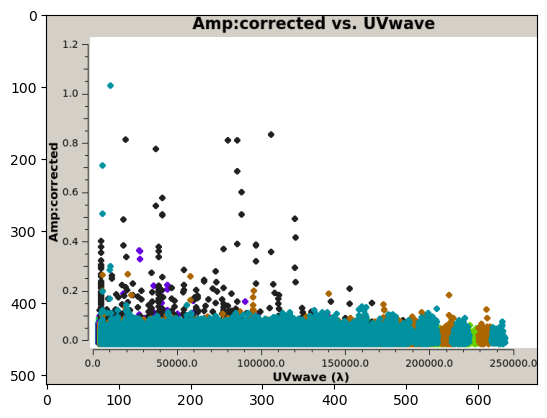

QSO J0202-0251


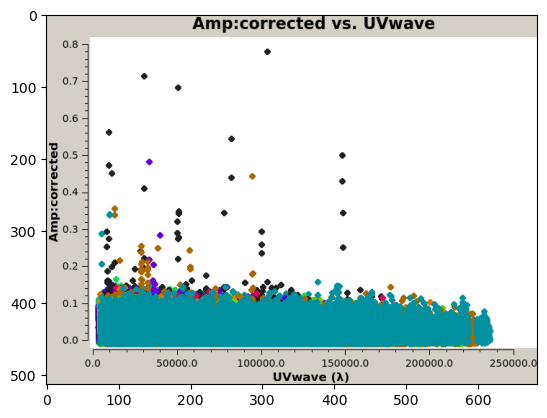

QSO J0206-0255


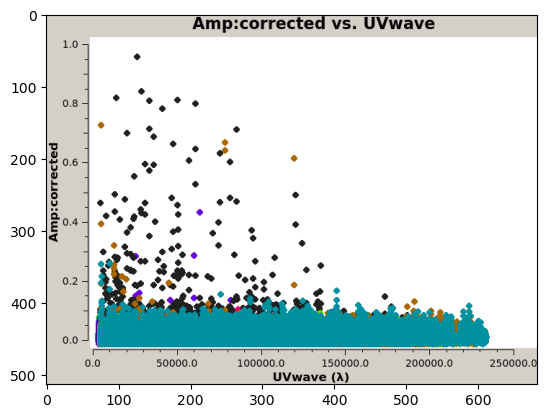

QSO J0217-0208


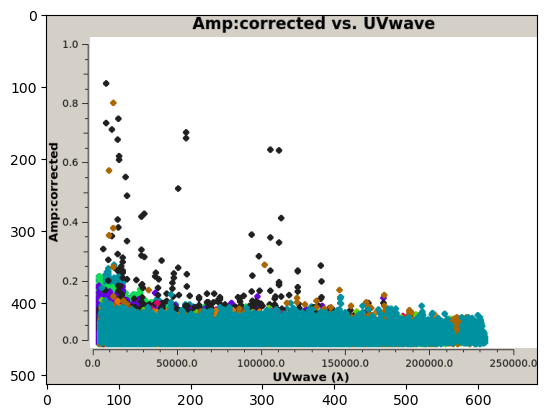

QSO J0210-0456


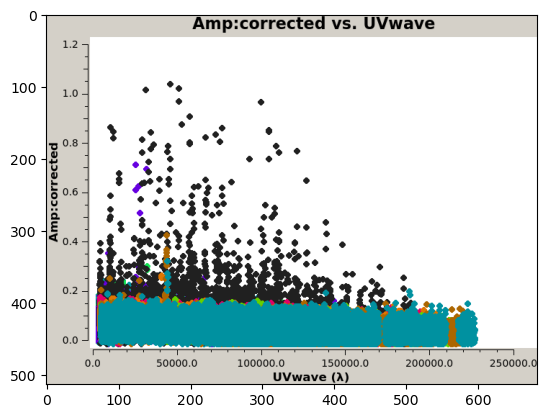

QSO J0216-0455


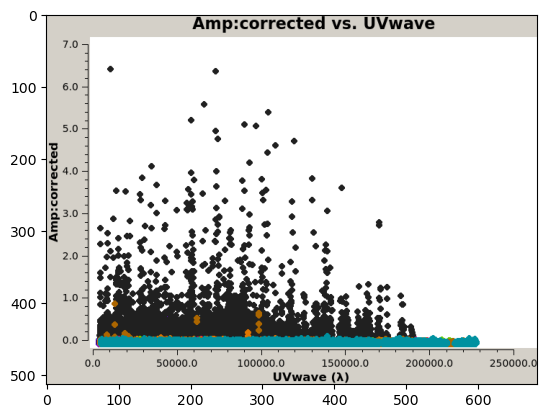

QSO J0221-0802


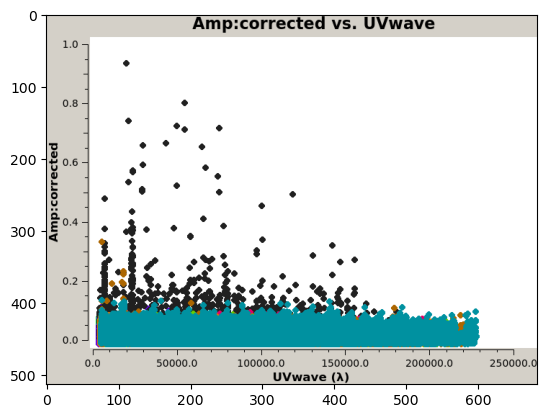

QSO J0227-0605


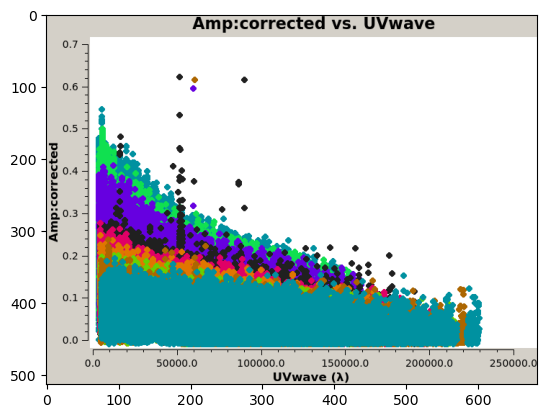

QSO J0235-0532


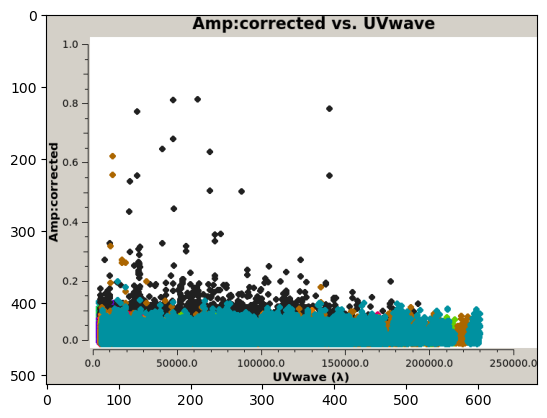

QSO J0303-0019


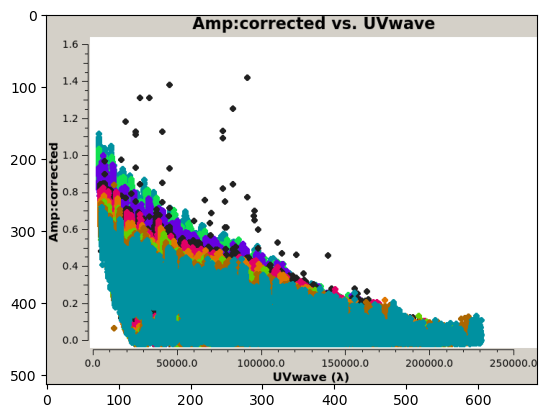

QSO J0353+0104


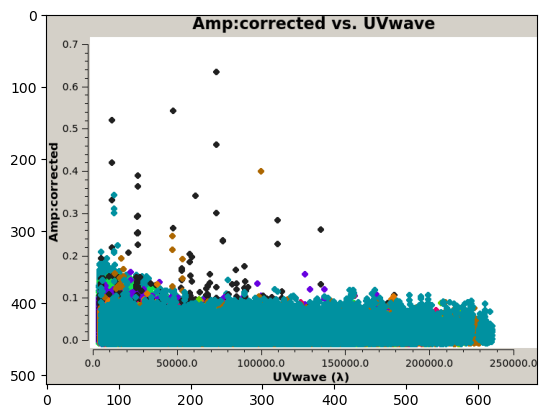

QSO J0402+2451


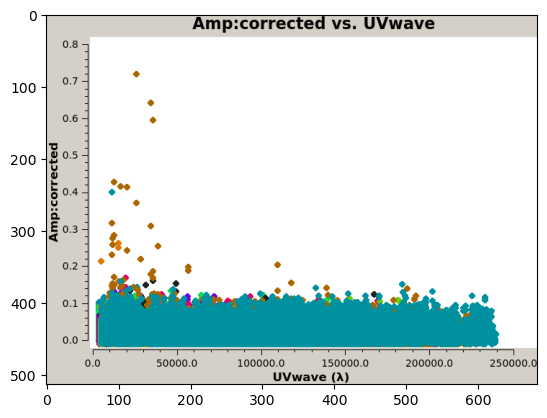

In [66]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_uvdist_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C48


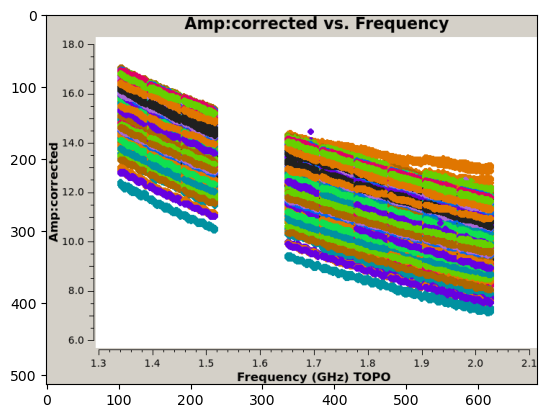

J0217+0144


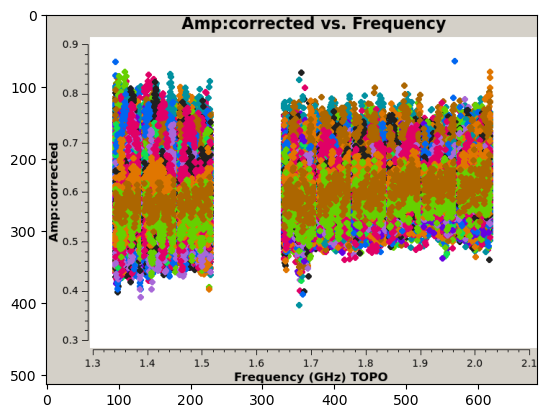

J0241-0815


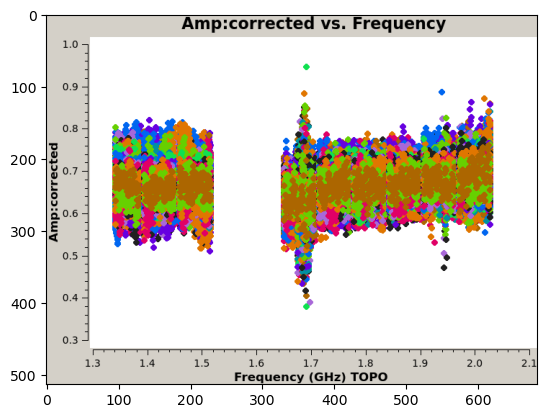

J0323+0534


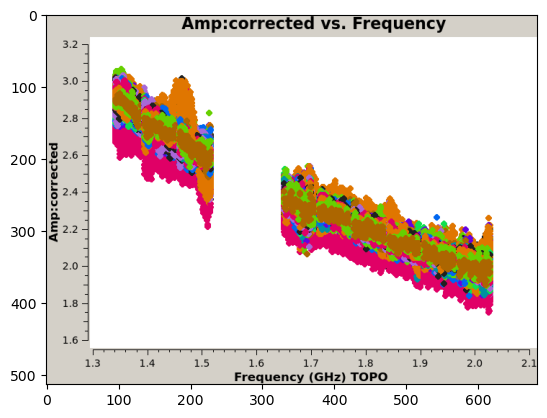

J0403+2600


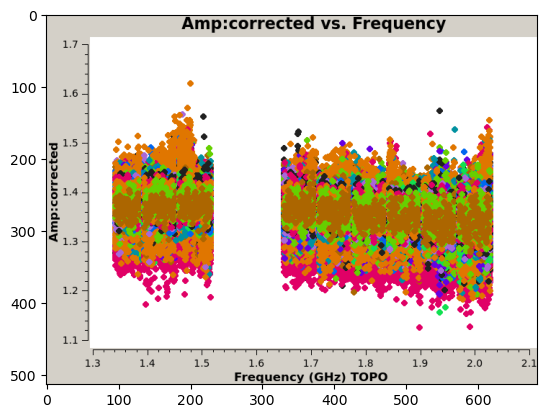

QSO J0226+0302


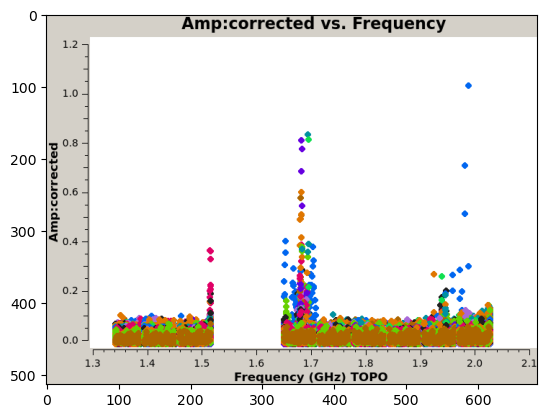

QSO J0202-0251


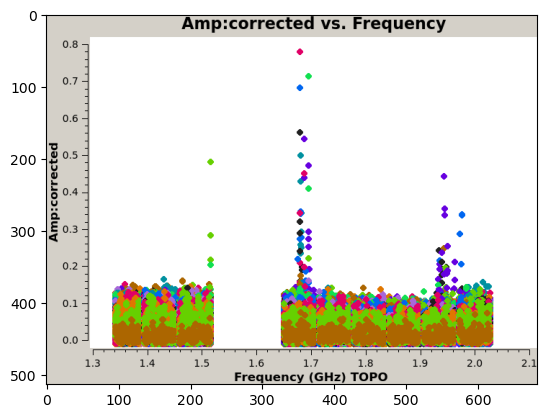

QSO J0206-0255


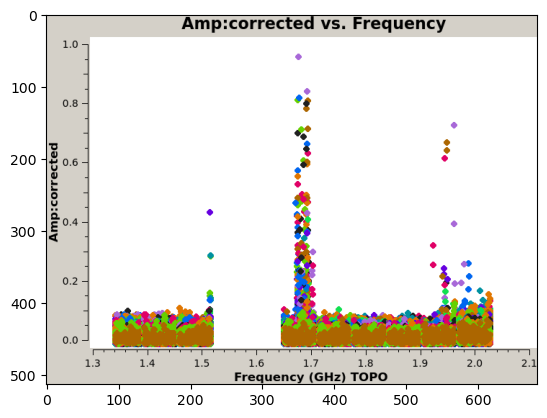

QSO J0217-0208


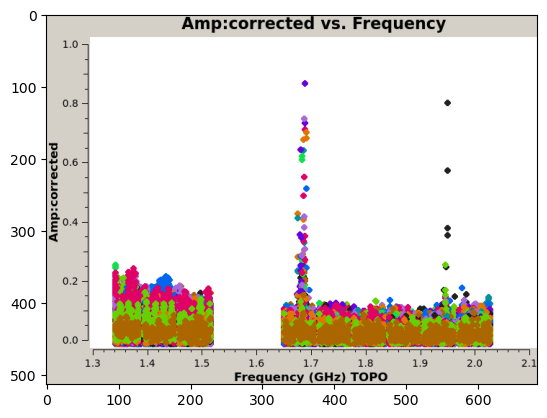

QSO J0210-0456


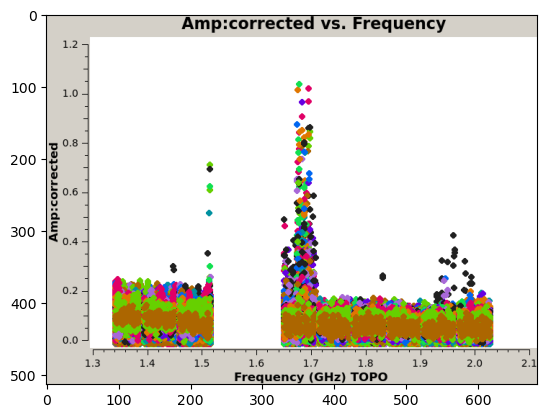

QSO J0216-0455


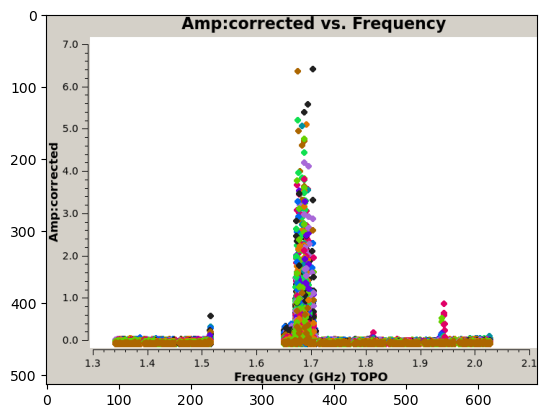

QSO J0221-0802


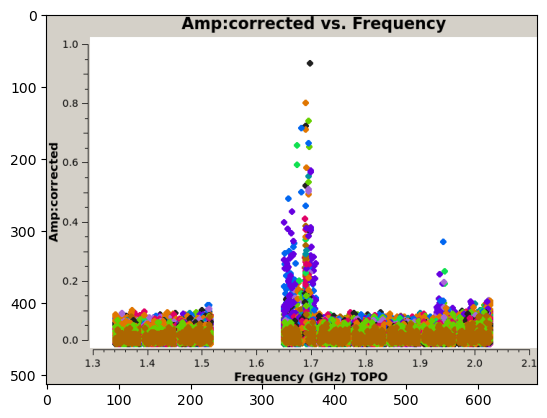

QSO J0227-0605


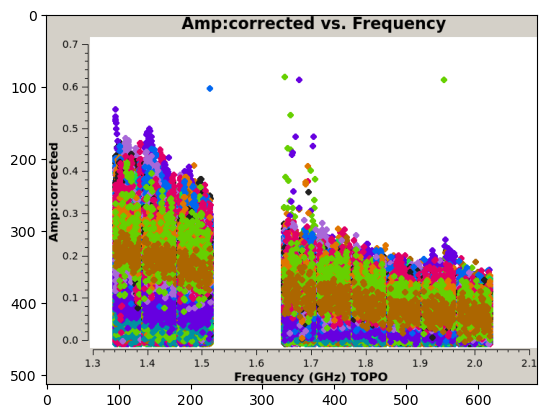

QSO J0235-0532


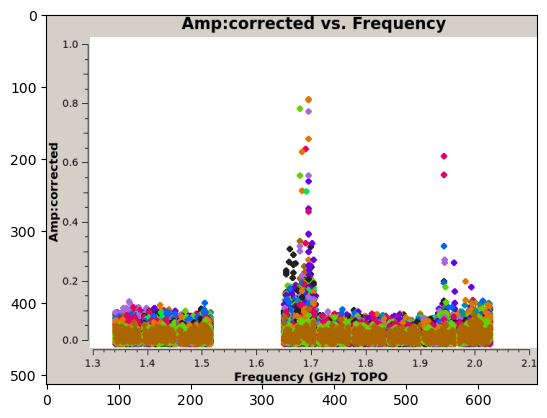

QSO J0303-0019


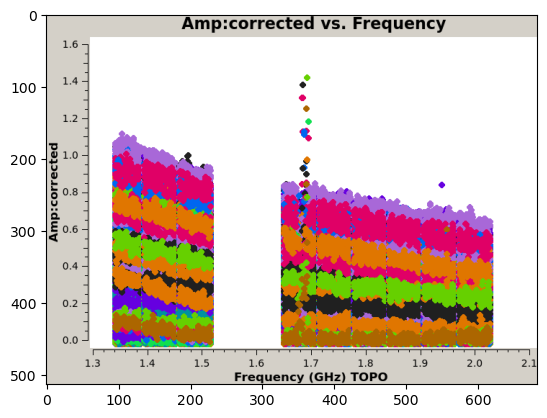

QSO J0353+0104


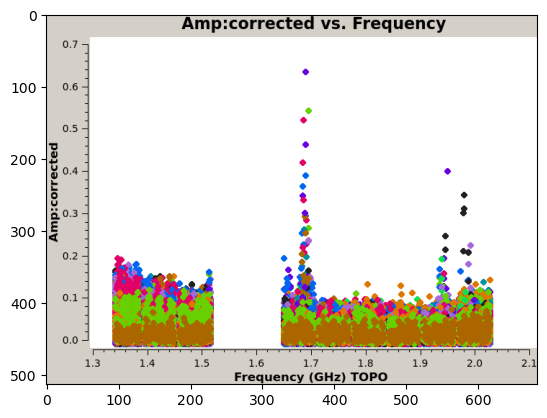

QSO J0402+2451


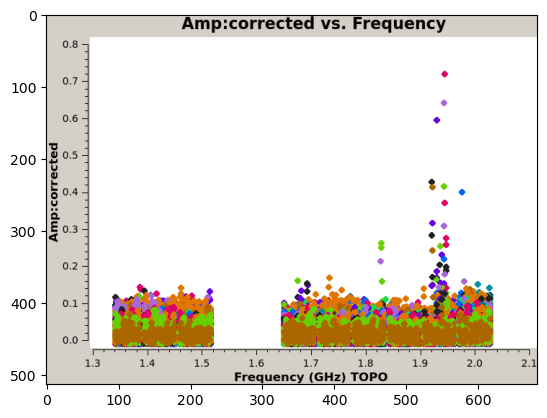

In [67]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C48


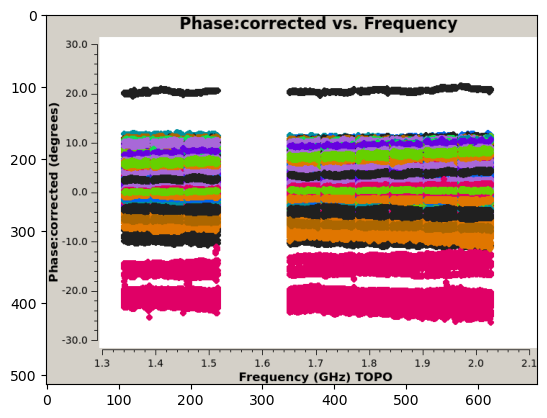

J0217+0144


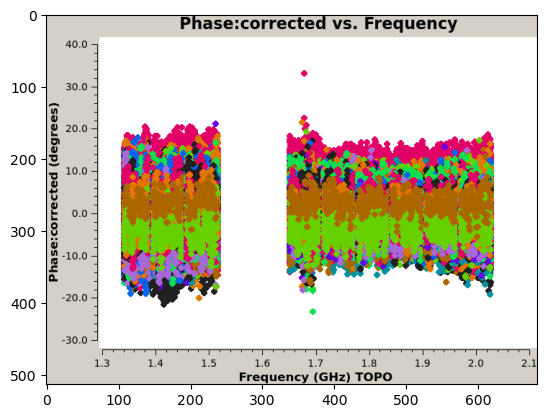

J0241-0815


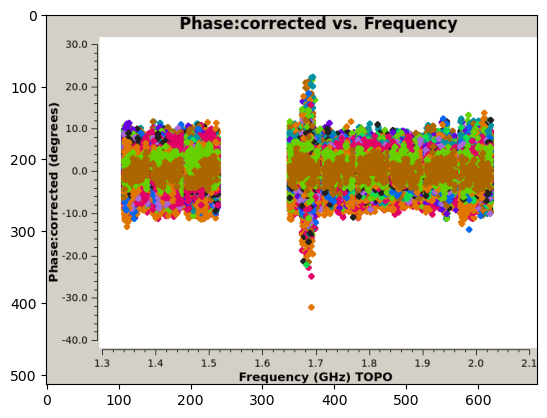

J0323+0534


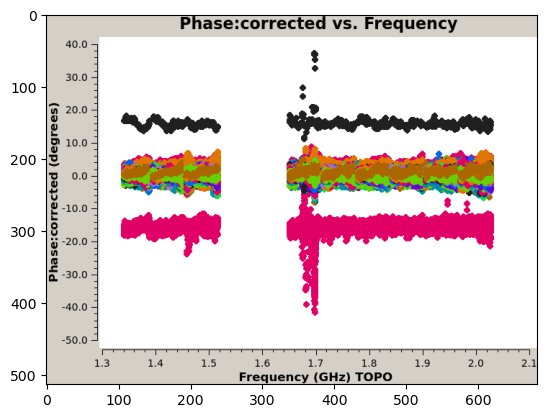

J0403+2600


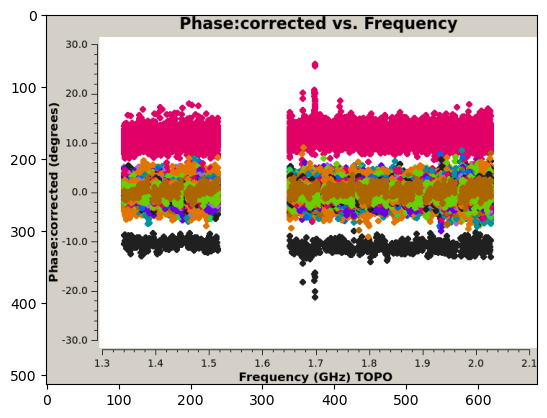

QSO J0226+0302


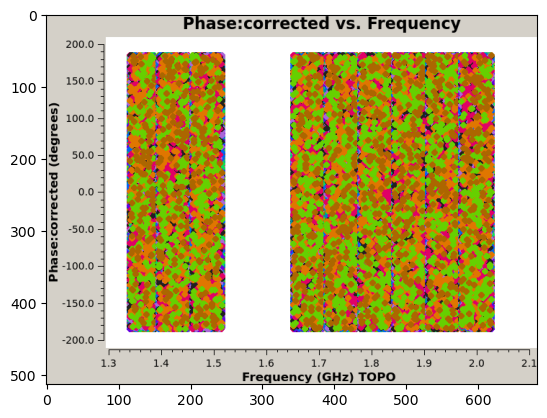

QSO J0202-0251


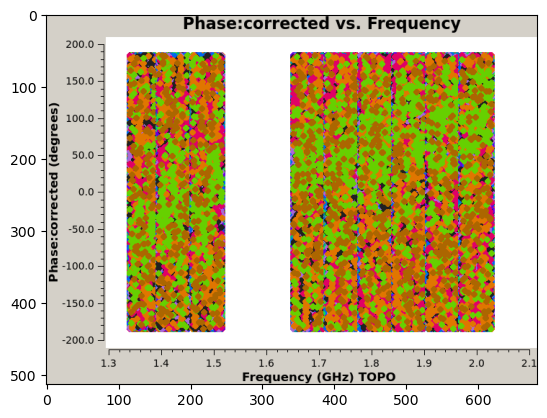

QSO J0206-0255


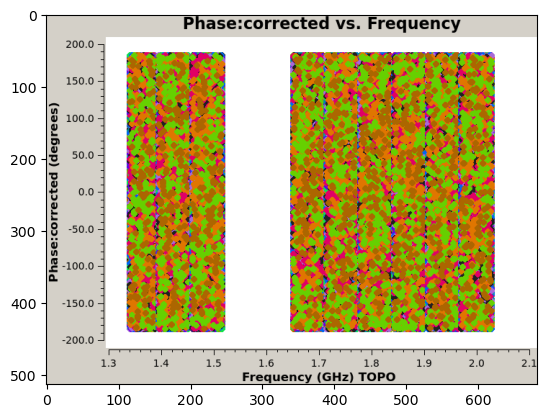

QSO J0217-0208


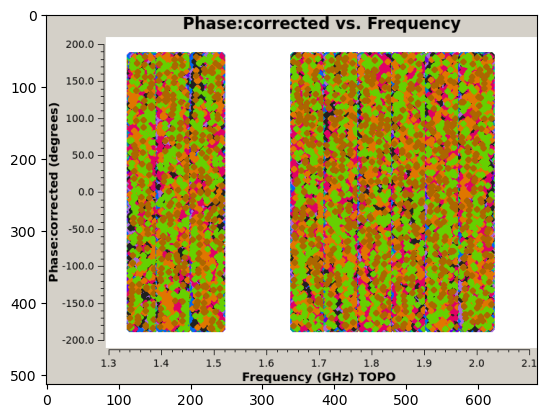

QSO J0210-0456


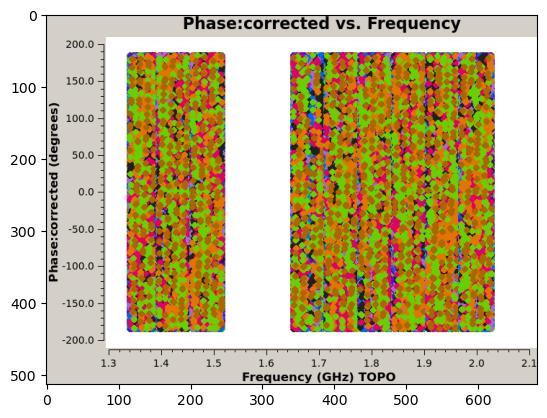

QSO J0216-0455


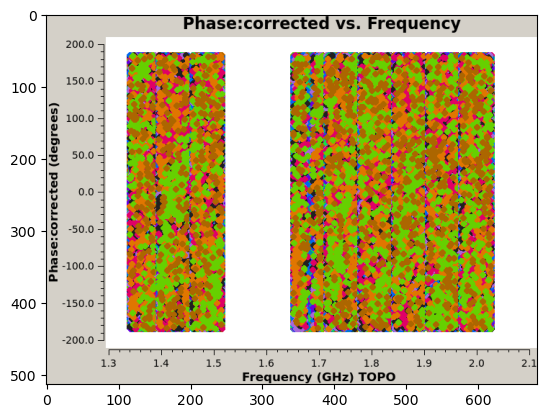

QSO J0221-0802


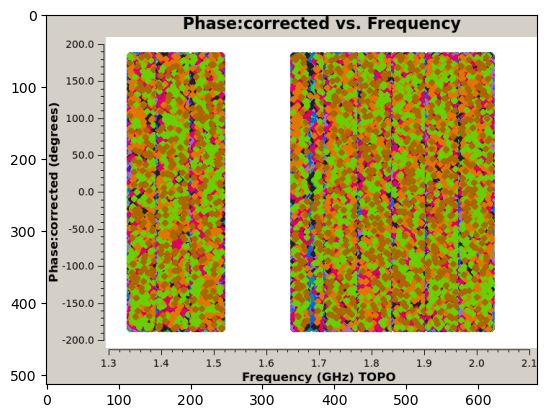

QSO J0227-0605


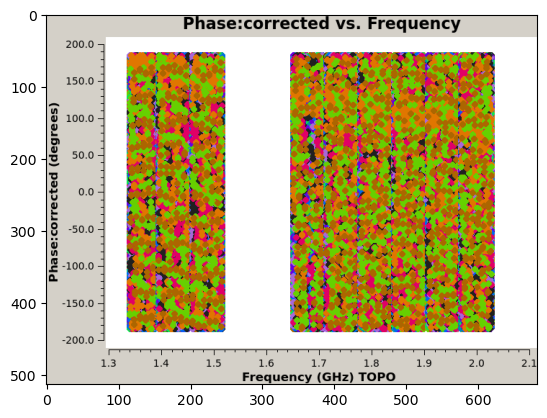

QSO J0235-0532


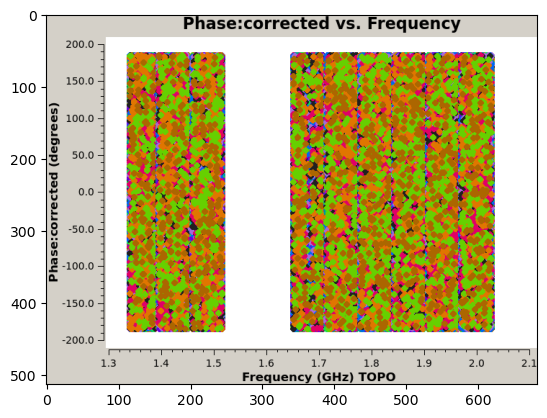

QSO J0303-0019


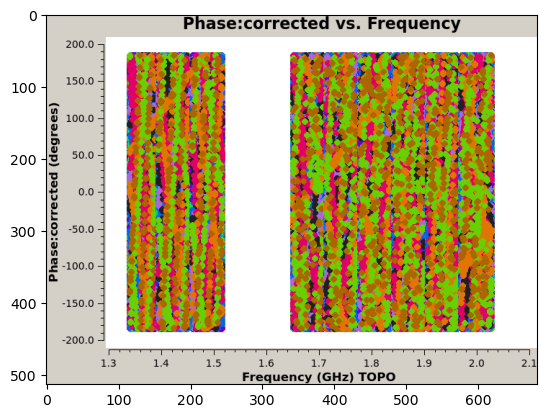

QSO J0353+0104


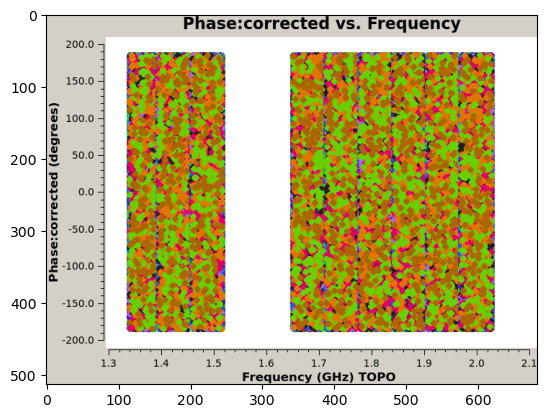

QSO J0402+2451


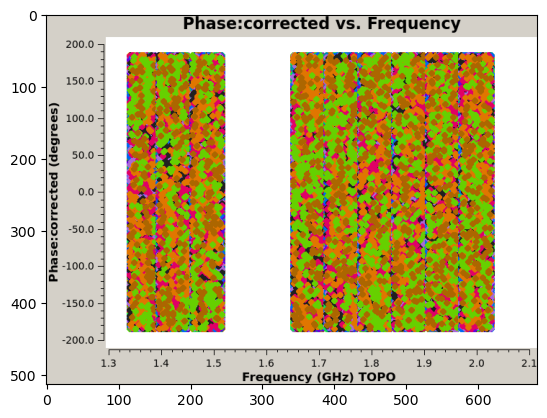

In [68]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_phase_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

In [69]:

with h5py.File(root + f"/output/z_score_corrected.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

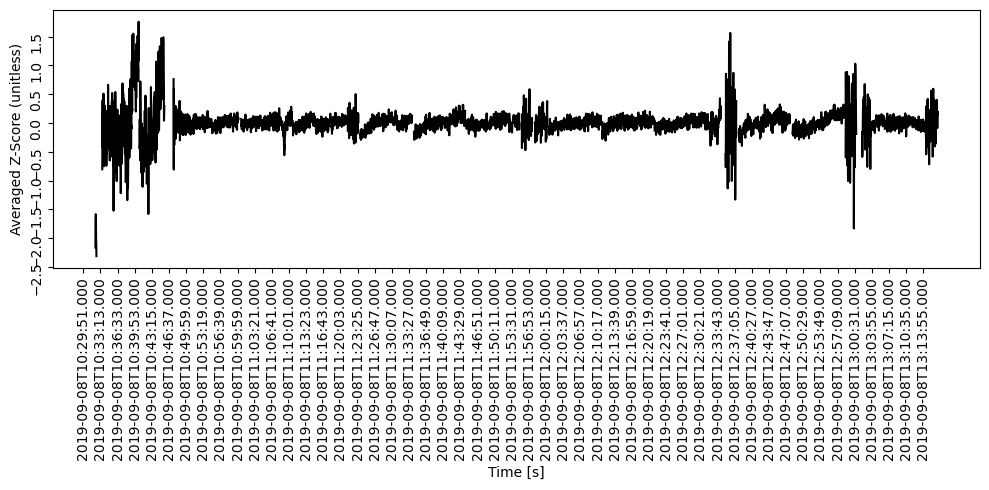

In [70]:
%matplotlib inline
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharex=True)
ax = inspect.plot_time_series(tisot, np.ma.median(z_score, axis=1), ax, plot_masked=True)
ax.set_ylabel("Averaged Z-Score (unitless)")
ax.set_xticks(tisot[::100])
plt.tight_layout()

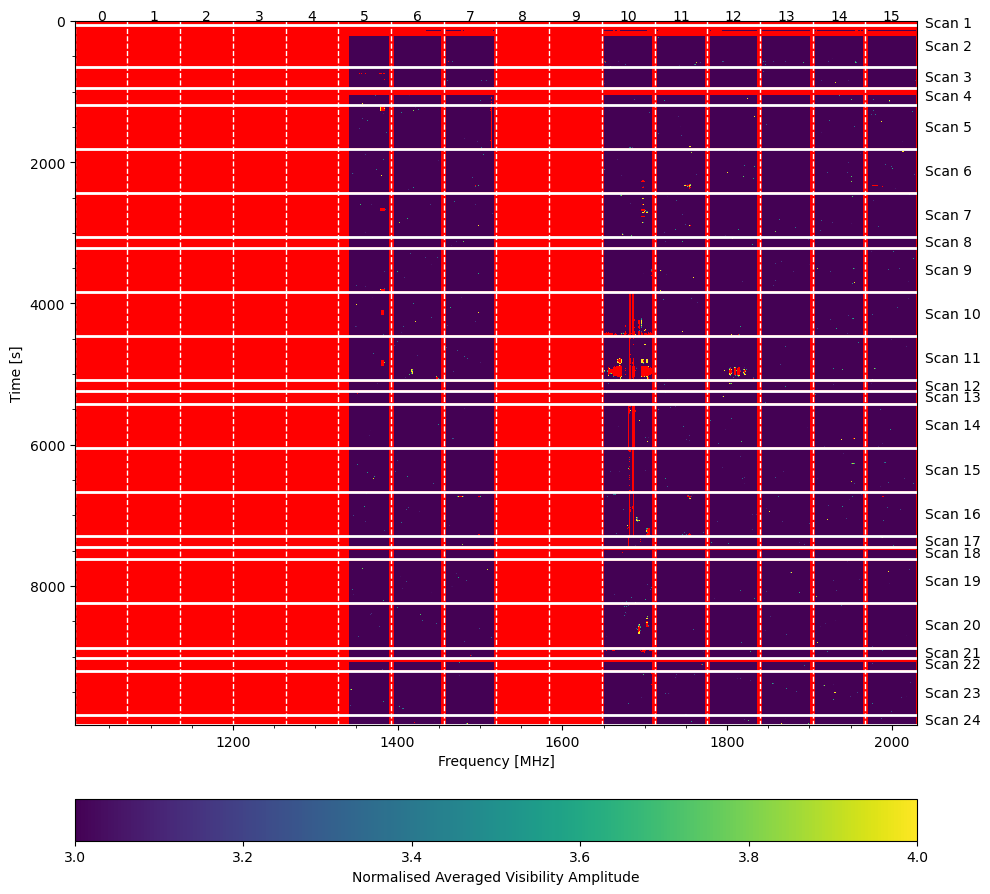

In [71]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10, 10))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=3, vmax=4, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", pad=0.08, label="Normalised Averaged Visibility Amplitude")